In [1]:
import re
import sys

import cartopy.crs as ccrs
import geopandas as gpd
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

sys.path.append("../")

# Import custom modules
from src.analytics.clustering import (
    calculate_cluster_validation,
    compute_cluster_centroids,
    normalize_seasonal_patterns,
    perform_hierarchical_clustering,
    prepare_clustering_features,
    scale_to_unit_range,
    smooth_discharge_patterns,
)
from src.analytics.regime_analysis import (
    build_regime_dataframe,
    group_patterns_by_cluster,
)
from src.analytics.static_analysis import (
    get_cluster_colors,
    get_cluster_markers,
    get_marker_size_corrections,
    interpret_cluster_from_data,
)
from src.constants.features import STANDARD_FEATURES
from src.exporters.cluster_exporter import (
    export_gauge_mapping_csv,
    generate_cluster_readme,
)
from src.plots.cluster_plots import (
    plot_cluster_heatmap,
    plot_dendrogram,
    plot_hybrid_spatial_clusters,
    plot_hydrograph_clusters,
    plot_spatial_clusters,
)
from src.plots.maps import russia_plots
from src.readers.geom_reader import load_geodata
from src.utils.logger import setup_logger

plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

log = setup_logger("chapter_one", log_file="../logs/chapter_one.log")

## 1. Load Data

In [2]:
# Load watershed geometries and gauge locations
ws, gauges = load_geodata(folder_depth="../")
basemap_data = gpd.read_file("../data/geometry/basemap_2023.gpkg")
common_index = gauges.index.to_list()

print(f"Loaded {len(gauges)} gauges and {len(ws)} watersheds")

Loaded 996 gauges and 996 watersheds


## 2. Geographical Clustering (9 clusters)

In [3]:
# Load HydroATLAS data
geo_data = pd.read_csv(
    "../data/attributes/hydro_atlas_cis_camels.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)

# Extract features and scale
geo_subset = geo_data.loc[common_index, STANDARD_FEATURES]
geo_scaled = scale_to_unit_range(geo_subset)

# Perform clustering
n_geo_clusters = 9
geo_labels, Z_geo = perform_hierarchical_clustering(geo_scaled, n_clusters=n_geo_clusters)

# Validation metrics
metrics = calculate_cluster_validation(geo_scaled, geo_labels)
print(f"\nGeographical clustering: {n_geo_clusters} clusters")
print(f"Silhouette score: {metrics['silhouette_avg']:.3f}")
print(f"Calinski-Harabasz: {metrics['calinski_harabasz']:.1f}")

2025-11-26 15:58:32 | INFO     | PhDLogger | src.analytics.clustering | ℹ️  Hierarchical clustering: 9 clusters, method=ward, metric=euclidean
2025-11-26 15:58:32 | INFO     | PhDLogger | src.analytics.clustering | ℹ️  Validation metrics: silhouette=0.207, CH=219.2, DB=1.434



Geographical clustering: 9 clusters
Silhouette score: 0.207
Calinski-Harabasz: 219.2


In [4]:
# Feature descriptions for cluster interpretation
feature_descriptions = {
    "for_pc_use": {
        "name": "Forest Cover",
        "description": "Percentage of forest area within the upstream watershed extent",
        "suffix": "use",
        "category": "Land Cover & Vegetation",
        "hydrological_impact": "Controls evapotranspiration rates through canopy interception and transpiration. Moderates peak flows by increasing infiltration and soil water storage. Reduces surface runoff generation and sediment transport. Critical for baseflow maintenance during dry periods.",
        "units": "%",
        "source": "GLC2000, GlobCover",
    },
    "crp_pc_use": {
        "name": "Cropland Extent",
        "description": "Percentage of agricultural cropland within the upstream watershed extent",
        "suffix": "use",
        "category": "Land Cover & Human Impact",
        "hydrological_impact": "Introduces seasonal hydrological variability tied to agricultural cycles. Increases surface runoff due to soil compaction and reduced vegetation cover. May alter natural flow regimes through irrigation water extraction. Affects nutrient and sediment transport patterns.",
        "units": "%",
        "source": "GLC2000, GlobCover",
    },
    "inu_pc_ult": {
        "name": "Inundation-Prone Areas",
        "description": "Percentage of areas susceptible to inundation within the total upstream watershed",
        "suffix": "ult",
        "category": "Flood & Water Regulation",
        "hydrological_impact": "Indicates natural flood storage capacity and wetland presence. Attenuates flood peaks through temporary water storage. Reduces flow variability and provides ecological buffer zones. Critical for understanding watershed flood risk and water regulation services.",
        "units": "%",
        "source": "GIEMS, MODIS",
    },
    "ire_pc_use": {
        "name": "Irrigated Area",
        "description": "Percentage of irrigated agricultural land within the upstream watershed extent",
        "suffix": "use",
        "category": "Land Cover & Human Impact",
        "hydrological_impact": "Directly reduces streamflow through water abstraction for irrigation. Alters natural flow regime and seasonal discharge patterns. May increase return flows and groundwater recharge in some areas. Critical indicator of anthropogenic water stress.",
        "units": "%",
        "source": "GMIA, FAO",
    },
    "lka_pc_use": {
        "name": "Lake Coverage",
        "description": "Percentage of lake area within the upstream watershed extent",
        "suffix": "use",
        "category": "Hydrology & Water Storage",
        "hydrological_impact": "Provides natural flow regulation and dampens hydrological variability. Delays hydrological response to precipitation events. Increases evaporation losses and modifies water temperature. Critical for understanding flow attenuation and storage capacity.",
        "units": "%",
        "source": "HydroLAKES, GLWD",
    },
    "prm_pc_use": {
        "name": "Permafrost Extent",
        "description": "Percentage of permafrost area within the upstream watershed extent",
        "suffix": "use",
        "category": "Cryosphere & Soil Properties",
        "hydrological_impact": "Severely restricts soil infiltration capacity, leading to high surface runoff. Creates extreme seasonal discharge patterns with minimal winter flow. Highly sensitive to climate warming with potential for regime shifts. Controls subsurface flow pathways and groundwater recharge.",
        "units": "%",
        "source": "NSIDC",
    },
    "pst_pc_use": {
        "name": "Pasture Coverage",
        "description": "Percentage of pasture and grazing land within the upstream watershed extent",
        "suffix": "use",
        "category": "Land Cover & Human Impact",
        "hydrological_impact": "Moderate infiltration capacity between forest and cropland. Grazing pressure may cause soil compaction affecting runoff generation. Less seasonal variability compared to cropland. Affects sediment yield and water quality through livestock impacts.",
        "units": "%",
        "source": "GLC2000, GlobCover",
    },
    "cly_pc_uav": {
        "name": "Clay Content",
        "description": "Percentage of clay in topsoil, area-weighted average across the upstream watershed",
        "suffix": "uav",
        "category": "Soil Properties",
        "hydrological_impact": "Low hydraulic conductivity restricts infiltration and promotes surface runoff. High water retention capacity but limited drainage. Increases flood risk during intense precipitation. Controls soil moisture dynamics and groundwater recharge potential.",
        "units": "%",
        "source": "SoilGrids, HWSD",
    },
    "slt_pc_uav": {
        "name": "Silt Content",
        "description": "Percentage of silt in topsoil, area-weighted average across the upstream watershed",
        "suffix": "uav",
        "category": "Soil Properties",
        "hydrological_impact": "Moderate infiltration and water-holding capacity between clay and sand. High susceptibility to erosion and sediment transport. Influences soil crusting which affects runoff generation. Critical for understanding sediment dynamics and water quality.",
        "units": "%",
        "source": "SoilGrids, HWSD",
    },
    "snd_pc_uav": {
        "name": "Sand Content",
        "description": "Percentage of sand in topsoil, area-weighted average across the upstream watershed",
        "suffix": "uav",
        "category": "Soil Properties",
        "hydrological_impact": "High hydraulic conductivity promotes rapid infiltration and groundwater recharge. Low water retention leads to reduced surface runoff but also lower soil moisture availability. Favors baseflow-dominated discharge regimes. Critical for aquifer recharge assessment.",
        "units": "%",
        "source": "SoilGrids, HWSD",
    },
    "kar_pc_use": {
        "name": "Karst Area",
        "description": "Percentage of karst terrain within the upstream watershed extent",
        "suffix": "use",
        "category": "Hydrogeology & Baseflow",
        "hydrological_impact": "Subsurface flow dominates over surface runoff through dissolution features. Spring-fed baseflow provides stable discharge during dry periods. Complex groundwater-surface water interactions. May exhibit losing/gaining stream reaches and high spatial flow variability.",
        "units": "%",
        "source": "WOKAM, GLHYMPS",
    },
    "urb_pc_use": {
        "name": "Urban Area",
        "description": "Percentage of urban and built-up area within the upstream watershed extent",
        "suffix": "use",
        "category": "Land Cover & Human Impact",
        "hydrological_impact": "Impervious surfaces generate rapid runoff and flashy hydrographs. Dramatically reduces infiltration and groundwater recharge. Increases flood peaks and decreases baseflow. Critical indicator of hydrological regime alteration and water quality degradation.",
        "units": "%",
        "source": "GLC2000, MODIS",
    },
    "gwt_cm_sav": {
        "name": "Groundwater Table Depth",
        "description": "Depth to groundwater table in centimeters, sub-basin area-weighted average",
        "suffix": "sav",
        "category": "Hydrogeology & Baseflow",
        "hydrological_impact": "Shallow water tables enhance baseflow contribution and maintain perennial flow. Deep water tables limit groundwater-surface water exchange. Controls riparian vegetation and wetland distribution. Critical for understanding drought resilience and low-flow characteristics.",
        "units": "cm",
        "source": "Fan et al. 2013",
    },
    "lkv_mc_usu": {
        "name": "Lake Volume",
        "description": "Total volume of lakes within the upstream watershed, summed upstream",
        "suffix": "usu",
        "category": "Hydrology & Water Storage",
        "hydrological_impact": "Quantifies total natural storage capacity affecting flow regulation. Large volumes dampen seasonal variability and moderate extreme events. Increases residence time and evaporation losses. Critical for understanding watershed buffering capacity and drought resilience.",
        "units": "million m³",
        "source": "HydroLAKES",
    },
    "rev_mc_usu": {
        "name": "Reservoir Volume",
        "description": "Total volume of reservoirs within the upstream watershed, summed upstream",
        "suffix": "usu",
        "category": "Hydrology & Anthropogenic Impact",
        "hydrological_impact": "Represents artificial flow regulation capacity through dam operations. Modifies natural flow regime according to management objectives. Reduces peak flows and increases low flows depending on operation rules. Critical for understanding anthropogenic hydrological alteration.",
        "units": "million m³",
        "source": "GRanD, HydroLAKES",
    },
    "slp_dg_sav": {
        "name": "Terrain Slope",
        "description": "Mean terrain slope in degrees, area-weighted average across the upstream watershed",
        "suffix": "sav",
        "category": "Topography & Physiography",
        "hydrological_impact": "Steep slopes accelerate runoff generation and reduce infiltration time. Controls flow velocity and time of concentration. Increases erosion potential and sediment transport. Critical for understanding flashiness and flood response timing.",
        "units": "degrees",
        "source": "SRTM, HydroSHEDS",
    },
    "sgr_dk_sav": {
        "name": "Stream Gradient",
        "description": "Stream channel gradient in decimal form, sub-basin area-weighted average",
        "suffix": "sav",
        "category": "Topography & River Morphology",
        "hydrological_impact": "Controls flow velocity and energy dissipation in the channel network. Steep gradients increase transport capacity for sediment and debris. Affects channel erosion, deposition patterns, and habitat structure. Critical for understanding hydraulic characteristics and geomorphic processes.",
        "units": "decimal",
        "source": "HydroSHEDS",
    },
    "ws_area": {
        "name": "Watershed Area",
        "description": "Total drainage area of the watershed",
        "suffix": "n/a",
        "category": "Topography & Physiography",
        "hydrological_impact": "Fundamental control on discharge magnitude and hydrological response. Larger watersheds exhibit dampened, delayed responses and higher baseflow contributions. Controls scaling relationships for flood peaks and low flows. Essential for understanding discharge regime and comparative hydrology.",
        "units": "km²",
        "source": "HydroSHEDS",
    },
    "ele_mt_uav": {
        "name": "Mean Elevation",
        "description": "Mean elevation in meters above sea level, area-weighted average across the upstream watershed",
        "suffix": "uav",
        "category": "Topography & Climate",
        "hydrological_impact": "Controls precipitation amount through orographic enhancement. Determines snowmelt versus rainfall-dominated regimes. Affects temperature, evapotranspiration rates, and vegetation zones. Critical for understanding vertical climate gradients and seasonal discharge patterns.",
        "units": "m",
        "source": "SRTM, HydroSHEDS",
    },
}

2025-11-26 15:58:33 | INFO     | PhDLogger | src.plots.cluster_plots | ℹ️  Saved dendrogram to ../res/chapter_one/geo_dendrogram.png


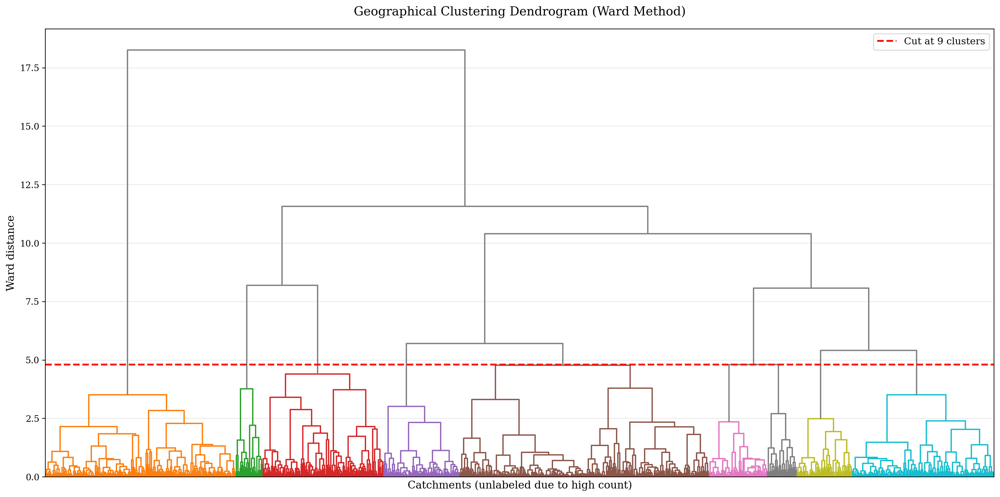

In [5]:
# Plot dendrogram
fig_dendro = plot_dendrogram(
    Z_geo,
    n_clusters=n_geo_clusters,
    output_path="../res/chapter_one/geo_dendrogram.png",
    title="Geographical Clustering Dendrogram (Ward Method)",
)
plt.show()

2025-11-26 15:58:33 | INFO     | PhDLogger | src.plots.cluster_plots | ℹ️  Saved heatmap to ../res/chapter_one/geo_heatmap.png


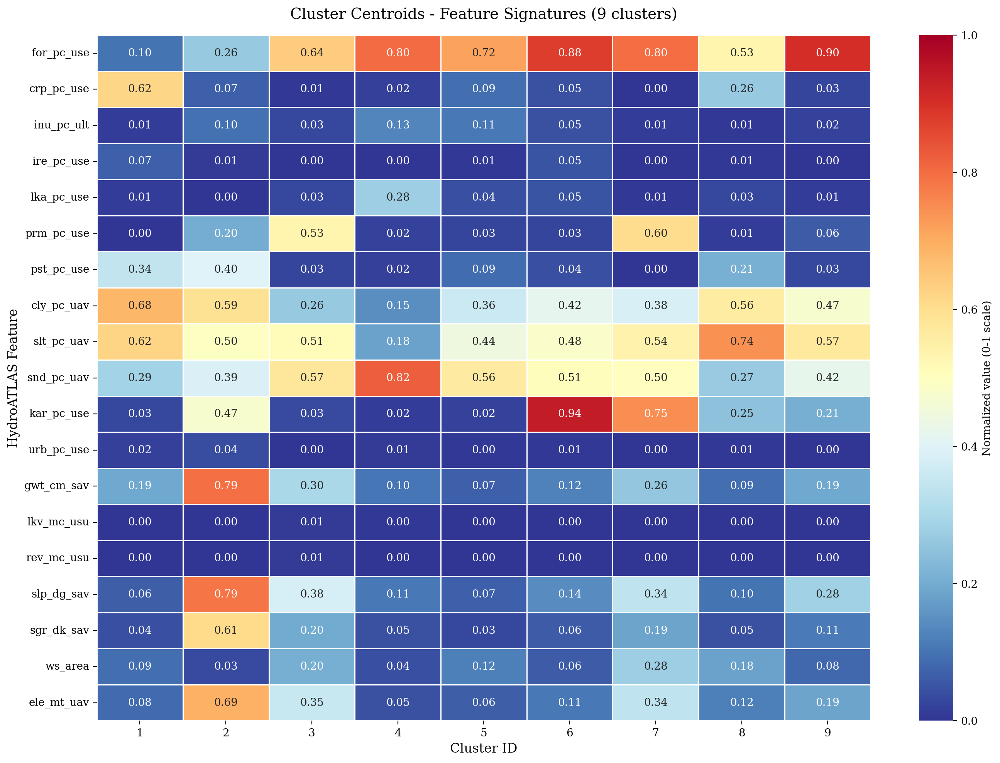

2025-11-26 15:58:47 | INFO     | PhDLogger | src.plots.cluster_plots | ℹ️  Saved spatial cluster map to ../res/chapter_one/map_geo_clusters.png


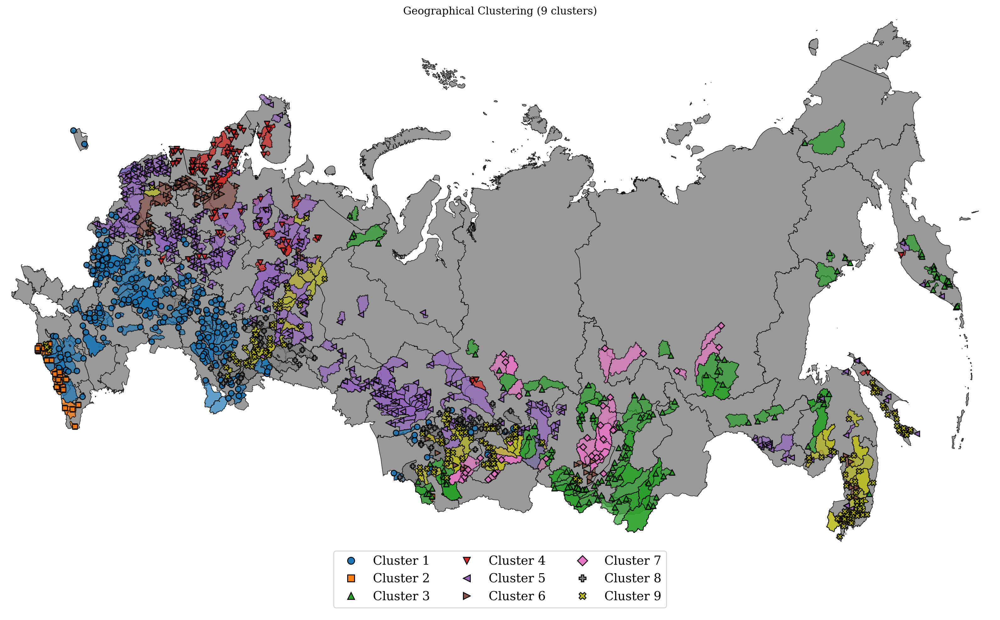

In [6]:
# Compute centroids
geo_centroids = compute_cluster_centroids(geo_scaled, geo_labels, STANDARD_FEATURES)

# Plot heatmap
fig_heatmap = plot_cluster_heatmap(
    geo_centroids, output_path="../res/chapter_one/geo_heatmap.png"
)
plt.show()

# Plot spatial distribution
fig_geo_spatial = plot_spatial_clusters(
    watersheds=ws,
    gauges=gauges,
    cluster_labels=geo_labels,
    cluster_col="geo_cluster",
    basemap=basemap_data,
    output_path="../res/chapter_one/map_geo_clusters.png",
    title="Geographical Clustering (9 clusters)",
    markersize=4,
    show_watersheds=True,
    show_gauges=True,
)
plt.show()

In [7]:
# Get markers and colors for clusters
markers_hc = get_cluster_markers(n_geo_clusters)
colors_hc = get_cluster_colors(n_geo_clusters)
marker_corrections = get_marker_size_corrections()

# Assign cluster labels to scaled data
geo_scaled["cluster_geo"] = geo_labels

# Compute cluster centroids (0-1 normalized values)
cluster_centroids = geo_scaled.groupby("cluster_geo")[STANDARD_FEATURES].mean()

# Also compute raw centroids for interpretation
cluster_centroids_raw = geo_subset.groupby(geo_labels)[STANDARD_FEATURES].mean()

# Generate cluster names using both normalized and raw values
cluster_names = pd.Series(index=range(1, n_geo_clusters + 1), dtype=str)
for cluster_id in range(1, n_geo_clusters + 1):
    normalized_row = cluster_centroids.loc[cluster_id, :]
    raw_row = cluster_centroids_raw.loc[cluster_id, :]
    cluster_names[cluster_id] = interpret_cluster_from_data(
        normalized_row, raw_row, feature_descriptions
    )

cluster_names.index.name = "Cluster"

print("\nGenerated cluster names:")
for cid, name in cluster_names.items():
    n_catch = (geo_labels == cid).sum()
    print(f"  Cluster {cid} (n={n_catch}): {name}")

# Create display names with cluster ID prefix for map legend
cluster_display_names = pd.Series(index=range(1, n_geo_clusters + 1), dtype=str)
for cid in range(1, n_geo_clusters + 1):
    cluster_display_names[cid] = f"C{cid}: {cluster_names[cid]}"


Generated cluster names:
  Cluster 1 (n=200): Clay-rich (19.6%)
  Cluster 2 (n=28): Deep GW (721cm) / Highland
  Cluster 3 (n=127): Mid-elevation (1063m) / Semi-arid (0mm/yr)
  Cluster 4 (n=80): Sandy (60.7%)
  Cluster 5 (n=262): Wetland (10.3) / Semi-arid (0mm/yr)
  Cluster 6 (n=61): Karst (93.6%) / Heavily Forested
  Cluster 7 (n=31): Karst (74.6%)
  Cluster 8 (n=58): Silty (48.3%)
  Cluster 9 (n=149): Heavily Forested (89.6%)


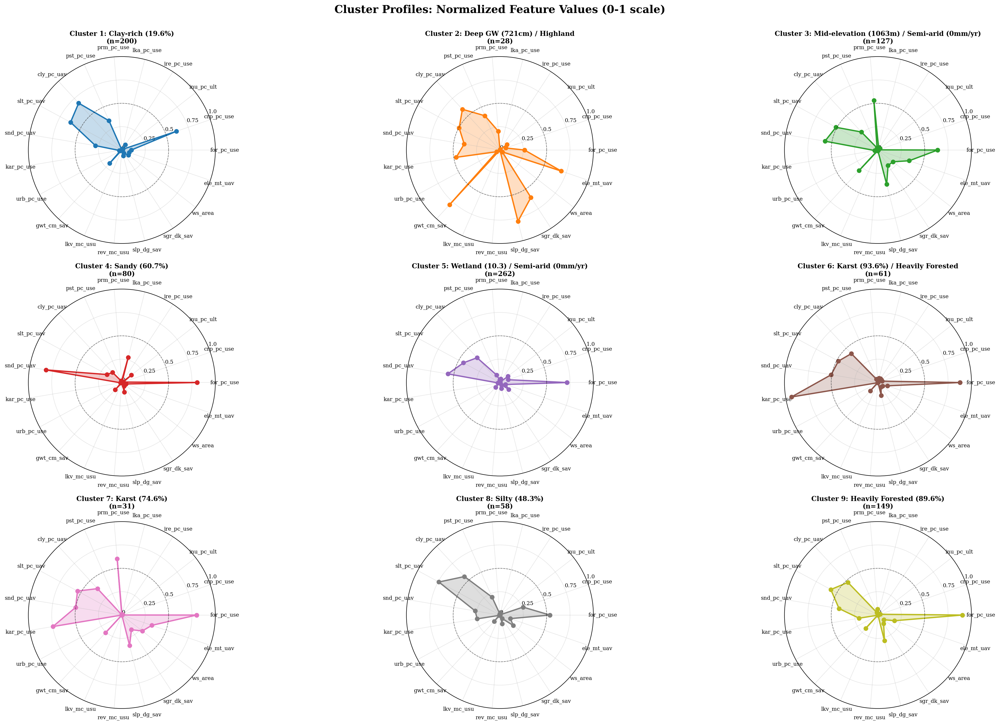


Color/Marker mapping verification:
  Cluster 1: uses color index 0 (color: #1f77b4)
  Cluster 2: uses color index 1 (color: #ff7f0e)
  Cluster 3: uses color index 2 (color: #2ca02c)
  Cluster 4: uses color index 3 (color: #d62728)
  Cluster 5: uses color index 4 (color: #9467bd)
  Cluster 6: uses color index 5 (color: #8c564b)
  Cluster 7: uses color index 6 (color: #e377c2)
  Cluster 8: uses color index 7 (color: #7f7f7f)
  Cluster 9: uses color index 8 (color: #bcbd22)


In [8]:
# Create radar charts for each cluster
n_features_display = len(STANDARD_FEATURES)
angles = np.linspace(0, 2 * np.pi, n_features_display, endpoint=False).tolist()
angles += angles[:1]  # Complete the circle

# Setup subplot grid
n_cols = 3
n_rows = int(np.ceil(n_geo_clusters / n_cols))
fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(25, n_rows * 5),
    subplot_kw={"projection": "polar"},
)
axes = axes.flatten() if n_geo_clusters > 1 else [axes]

for idx, cluster_id in enumerate(range(1, n_geo_clusters + 1)):
    ax = axes[idx]

    # Get centroid values (0-1 normalized)
    values = cluster_centroids.loc[cluster_id, STANDARD_FEATURES].tolist()
    values += values[:1]  # Complete the circle

    # Use cluster_id - 1 to index colors (ensures Cluster 1 uses colors_hc[0])
    color_idx = cluster_id - 1

    # Plot
    ax.plot(
        angles,
        values,
        "o-",
        linewidth=2,
        color=colors_hc[color_idx],
        label=cluster_names[cluster_id],
    )
    ax.fill(angles, values, alpha=0.25, color=colors_hc[color_idx])

    # Styling
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(STANDARD_FEATURES, size=8)
    ax.set_ylim(0, 1)
    ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
    ax.set_yticklabels(["0", "0.25", "0.5", "0.75", "1.0"], size=8)
    ax.grid(True, alpha=0.3)

    # Title with cluster size and name
    n_catchments = (geo_labels == cluster_id).sum()
    ax.set_title(
        f"Cluster {cluster_id}: {cluster_names[cluster_id]}\n(n={n_catchments})",
        size=10,
        weight="bold",
        pad=20,
    )

    # Add median line (0.5)
    ax.axhline(y=0.5, color="black", linestyle="--", linewidth=0.8, alpha=0.5)

# Remove empty subplots
for idx in range(n_geo_clusters, len(axes)):
    fig.delaxes(axes[idx])

plt.suptitle(
    "Cluster Profiles: Normalized Feature Values (0-1 scale)",
    fontsize=16,
    y=1.00,
    weight="bold",
)
plt.tight_layout()
fig.savefig(
    "../res/chapter_one/geo_cluster_radar_profiles.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

print("\nColor/Marker mapping verification:")
for cid in range(1, n_geo_clusters + 1):
    color_idx = cid - 1
    print(
        f"  Cluster {cid}: uses color index {color_idx} (color: {colors_hc[color_idx]})"
    )

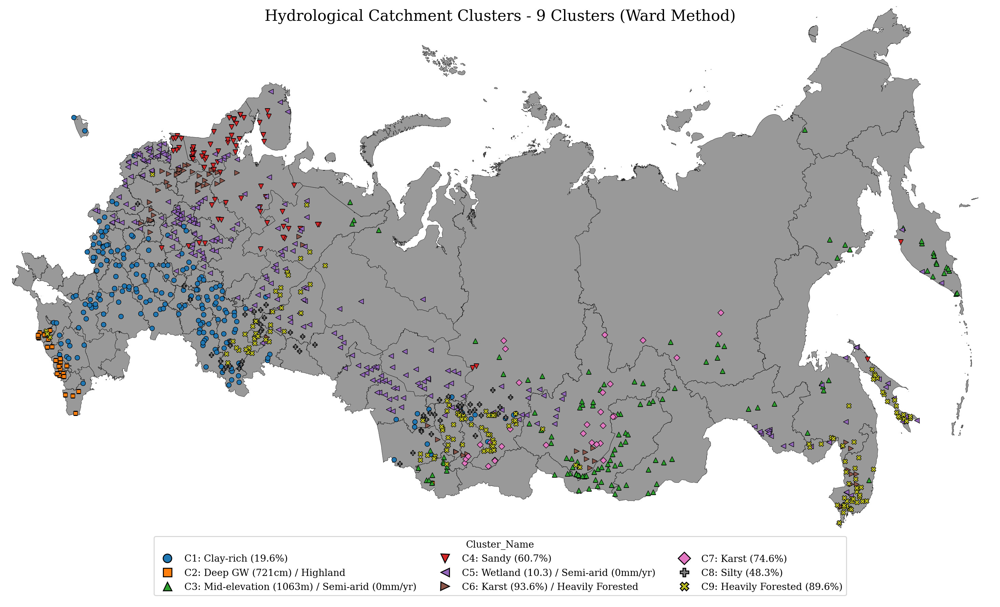

In [9]:
# Prepare cluster names for geographic visualization
gauge_clustered = gauges.copy()
# Use display names with "C{id}:" prefix so sorting works correctly
gauge_clustered["Cluster_Name"] = [cluster_display_names[cl] for cl in geo_labels]

# Plot map with proper cluster names
fig_clusters_map = russia_plots(
    gdf_to_plot=gauge_clustered,
    basemap_data=basemap_data,
    distinction_col="Cluster_Name",
    markers_list=markers_hc,
    color_list=colors_hc,
    marker_size_corrections=marker_corrections,
    figsize=(16, 9),
    just_points=True,
    legend_cols=3,
    base_marker_size=25,
    base_linewidth=0.5,
)

fig_clusters_map.suptitle(
    f"Hydrological Catchment Clusters - {n_geo_clusters} Clusters (Ward Method)",
    fontsize=16,
    y=0.98,
)
fig_clusters_map.savefig(
    "../res/chapter_one/geo_hierarchical_clusters_map.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

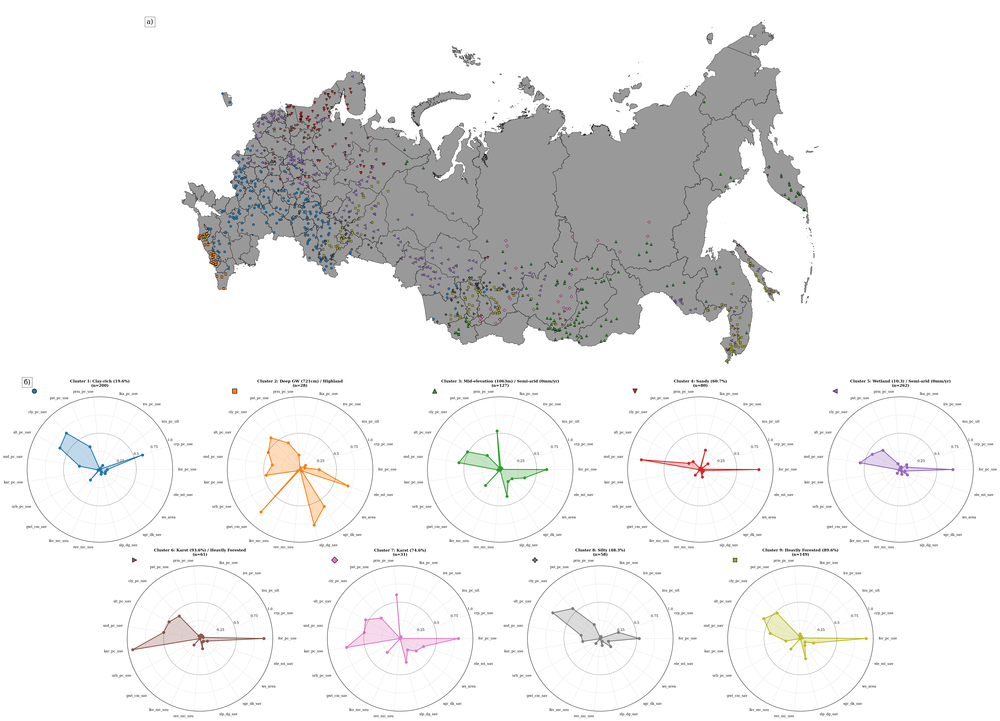

In [10]:
# Combined visualization: Map + Radar Charts
fig = plt.figure(figsize=(32, 26))
gs = gridspec.GridSpec(nrows=14, ncols=9, figure=fig, wspace=0.18, hspace=0.26)

# Define projection
aea_crs = ccrs.AlbersEqualArea(
    central_longitude=100,
    standard_parallels=(50, 70),
    central_latitude=56,
    false_easting=0,
    false_northing=0,
)
aea_crs_proj4 = aea_crs.proj4_init

# Map configuration
gdf_to_plot = gauge_clustered
distinction_col = "Cluster_Name"
legend_cols = 5
base_marker_size = 28
base_linewidth = 0.5

# TOP: Map spans rows 0..6 over all columns
ax1 = fig.add_subplot(gs[0:7, :], projection=aea_crs)
ax1.set_aspect("equal")
ax1.axis("off")

# Plot basemap
basemap_data.to_crs(aea_crs_proj4).plot(
    ax=ax1, color="grey", edgecolor="black", legend=False, alpha=0.8, linewidth=0.6
)

# Reproject data
gdf_proj = gdf_to_plot.to_crs(aea_crs_proj4)

# Get sorted categories
raw_cats = list(gdf_proj[distinction_col].astype(str).unique())
cats = sorted(
    raw_cats,
    key=lambda x: int(re.search(r"\d+", x).group())
    if re.search(r"\d+", x)
    else float("inf"),
)
n_cats = len(cats)

# Use markers and colors
colors = np.array([plt.matplotlib.colors.to_rgba(c) for c in colors_hc])

# Variation tiers for repeated markers
size_variants = [1.0, 1.4, 1.8]
linewidth_variants = [1.0, 1.6, 2.2]
n_markers = len(markers_hc)

handles = []
# Plot each category with custom markers and colors
for i, cat in enumerate(cats):
    sub = gdf_proj[gdf_proj[distinction_col].astype(str) == cat]
    if sub.empty:
        continue
    xs = sub.geometry.x
    ys = sub.geometry.y

    # Choose marker and compute repetition index
    marker = markers_hc[i % n_markers]
    repeat_idx = i // n_markers
    size_factor = size_variants[repeat_idx % len(size_variants)]
    lw_factor = linewidth_variants[repeat_idx % len(linewidth_variants)]

    # Apply marker-specific size correction
    if marker in marker_corrections:
        size_factor *= marker_corrections[marker]

    # Choose color
    col = colors[i % len(colors)]

    size = int(base_marker_size * size_factor)
    linewidth = float(base_linewidth * lw_factor)

    ax1.scatter(
        xs,
        ys,
        marker=marker,
        s=size,
        c=[col],
        edgecolor="black",
        linewidth=linewidth,
        zorder=3,
    )

    # Create legend handle
    legend_size = max(4, int(0.45 * 20))
    handles.append(
        Line2D(
            [],
            [],
            marker=marker,
            color="black",
            markerfacecolor=col,
            markeredgecolor="black",
            linestyle="None",
            markersize=legend_size,
            label=str(cat),
        )
    )

# BOTTOM: Radar charts for clusters
mid_area = gs[7:13, 0:9]
radar_gs = mid_area.subgridspec(2, 19, wspace=0.10, hspace=0.10)

# Layout: top row 5 panels, bottom row 4 panels
top_slices = [(0, 0, 3), (0, 4, 7), (0, 8, 11), (0, 12, 15), (0, 16, 19)]
bottom_slices = [(1, 2, 5), (1, 6, 9), (1, 10, 13), (1, 14, 17)]

max_panels = 9
n_to_plot = min(n_geo_clusters, max_panels)
top_count = min(5, n_to_plot)
bottom_cnt = min(4, n_to_plot - top_count)


def _add_ax(row, c0, c1):
    ax = fig.add_subplot(radar_gs[row, c0:c1], projection="polar")
    try:
        ax.set_box_aspect(1)
    except Exception:
        ax.set_aspect(1.0, adjustable="box")
    return ax


axes = []
for k in range(top_count):
    axes.append(_add_ax(*top_slices[k]))
for k in range(bottom_cnt):
    axes.append(_add_ax(*bottom_slices[k]))


def _beautify_radar_ticks(ax, angles, labels, fs=8, pad=3, show_every=2):
    deg = np.degrees(angles[:-1])
    lbls = [lab if (i % show_every) == 0 else "" for i, lab in enumerate(labels)]
    ax.set_thetagrids(deg, lbls)
    for lab, d in zip(ax.get_xticklabels(), deg):
        rot = d - 90 if d <= 180 else d - 270
        lab.set_rotation(rot)
        lab.set_rotation_mode("anchor")
        lab.set_fontsize(fs)
        lab.set_verticalalignment("center")
        lab.set_horizontalalignment("left" if (d <= 90 or d >= 270) else "right")
    ax.tick_params(pad=pad)


# Plot clusters
for idx, cid in enumerate(range(1, n_to_plot + 1)):
    ax = axes[idx]
    vals = cluster_centroids.loc[cid, STANDARD_FEATURES].tolist()
    vals += vals[:1]

    color_idx = (cid - 1) % len(colors_hc)
    mk = markers_hc[(cid - 1) % len(markers_hc)]

    ax.plot(angles, vals, "o-", linewidth=2.0, color=colors_hc[color_idx], zorder=2)
    ax.fill(angles, vals, alpha=0.28, color=colors_hc[color_idx], zorder=1)

    _beautify_radar_ticks(ax, angles, STANDARD_FEATURES, fs=8, pad=2, show_every=1)

    ax.set_ylim(0, 1.0)
    ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
    ax.set_yticklabels(["0", "0.25", "0.5", "0.75", "1.0"], fontsize=8)
    ax.grid(True, alpha=0.3)
    ax.axhline(0.5, color="black", linestyle="--", linewidth=0.8, alpha=0.5)

    n_catch = int((geo_labels == cid).sum())
    ax.set_title(
        f"Cluster {cid}: {cluster_names[cid]}\n(n={n_catch})",
        fontsize=9,
        weight="bold",
        pad=8,
    )
    ax.scatter(
        0.05,
        1.04,
        marker=mk,
        s=110,
        c=[colors_hc[color_idx]],
        edgecolor="black",
        linewidth=1.0,
        transform=ax.transAxes,
        clip_on=False,
        zorder=3,
    )

# Panel tags
ax1.text(
    0.0,
    0.95,
    "а)",
    transform=ax1.transAxes,
    fontsize=16,
    va="center",
    ha="center",
    bbox=dict(facecolor="white", alpha=0.5),
)
if axes:
    axes[0].text(
        0.0,
        1.10,
        "б)",
        transform=axes[0].transAxes,
        fontsize=16,
        va="center",
        ha="center",
        bbox=dict(facecolor="white", alpha=0.5),
    )

fig.subplots_adjust(left=0.02, right=0.985, top=0.985, bottom=0.02)
fig.savefig(
    "../res/chapter_one/geo_combined_map_radar.png",
    dpi=300,
    bbox_inches="tight",
)
plt.show()

## 3. Hydrological Clustering (10 clusters)

In [11]:
# Load discharge time series
discharge_data = {}
for gauge_id in ws.index:
    try:
        with xr.open_dataset(f"../data/nc_all_q/{gauge_id}.nc") as ds:
            df = ds.to_dataframe()
        discharge_data[gauge_id] = df[["q_mm_day"]].squeeze()
    except Exception as e:
        log.error(f"Error loading {gauge_id}: {e}")
        continue

# Calculate seasonal cycles
q_df = {}
for gauge_id, ts in discharge_data.items():
    seasonal_cycle = ts.groupby([ts.index.month, ts.index.day]).median().values
    q_df[gauge_id] = seasonal_cycle

q_df = pd.DataFrame.from_dict(q_df, orient="columns")
q_df = q_df.loc[:, q_df.max() < 50]  # Filter outliers

# Smooth and normalize
q_df_smoothed = smooth_discharge_patterns(q_df)
q_df_normalized = normalize_seasonal_patterns(q_df_smoothed)

# Prepare clustering features
q_df_clust = prepare_clustering_features(q_df_normalized, gauges, include_coords=True)

print(f"\nPrepared {len(q_df_clust)} gauges for hydrological clustering")

2025-11-26 15:59:13 | INFO     | PhDLogger | src.analytics.clustering | ℹ️  Smoothed 996 discharge patterns: median_window=5, savgol_window=11
2025-11-26 15:59:13 | INFO     | PhDLogger | src.analytics.clustering | ℹ️  Prepared clustering features: 996 gauges x 368 features



Prepared 996 gauges for hydrological clustering


2025-11-26 15:59:13 | INFO     | PhDLogger | src.analytics.clustering | ℹ️  Hierarchical clustering: 10 clusters, method=ward, metric=euclidean
2025-11-26 15:59:13 | INFO     | PhDLogger | src.plots.cluster_plots | ℹ️  Saved dendrogram to ../res/chapter_one/hydro_dendrogram.png


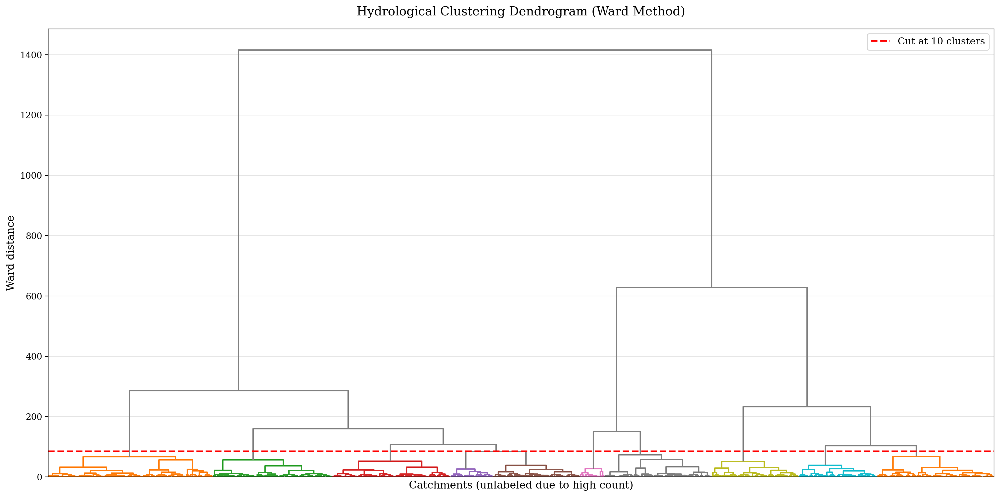

In [12]:
# Perform hydrological clustering
n_hydro_clusters = 10
hydro_labels, Z_hydro = perform_hierarchical_clustering(
    q_df_clust, n_clusters=n_hydro_clusters
)

# Plot dendrogram
fig_hydro_dendro = plot_dendrogram(
    Z_hydro,
    n_clusters=n_hydro_clusters,
    output_path="../res/chapter_one/hydro_dendrogram.png",
    title="Hydrological Clustering Dendrogram (Ward Method)",
)
plt.show()

In [13]:
# Extract regime characteristics
gauge_hydro_mapping = pd.Series(
    hydro_labels, index=q_df_clust.index, name="hydro_cluster"
)
cluster_patterns = group_patterns_by_cluster(q_df_normalized, gauge_hydro_mapping)

regime_df = build_regime_dataframe(cluster_patterns, language="ru")
print("\nHydrological Regime Characteristics:")
print(regime_df[["cluster_name", "peak_doy", "regime_type", "cv"]])


Hydrological Regime Characteristics:
  cluster_name  peak_doy                      regime_type        cv
0    Cluster 1       123  Весеннее половодье (паводочный)  1.470845
1    Cluster 2       111  Весеннее половодье (паводочный)  1.105821
2    Cluster 3       104  Весеннее половодье (паводочный)  1.797047
3    Cluster 4       173    Летнее половодье (паводочный)  0.882858
4    Cluster 5       102  Весеннее половодье (паводочный)  0.902980
5    Cluster 6       166    Летнее половодье (паводочный)  1.103826
6    Cluster 7       132      Весенне-летний (паводочный)  0.932015
7    Cluster 8       158    Летнее половодье (паводочный)  0.855520
8    Cluster 9       121  Весеннее половодье (паводочный)  1.228615
9   Cluster 10       119  Весеннее половодье (паводочный)  1.598268


2025-11-26 15:59:16 | INFO     | PhDLogger | src.plots.cluster_plots | ℹ️  Saved hydrograph clusters to ../res/chapter_one/hydrograph_clusters.png


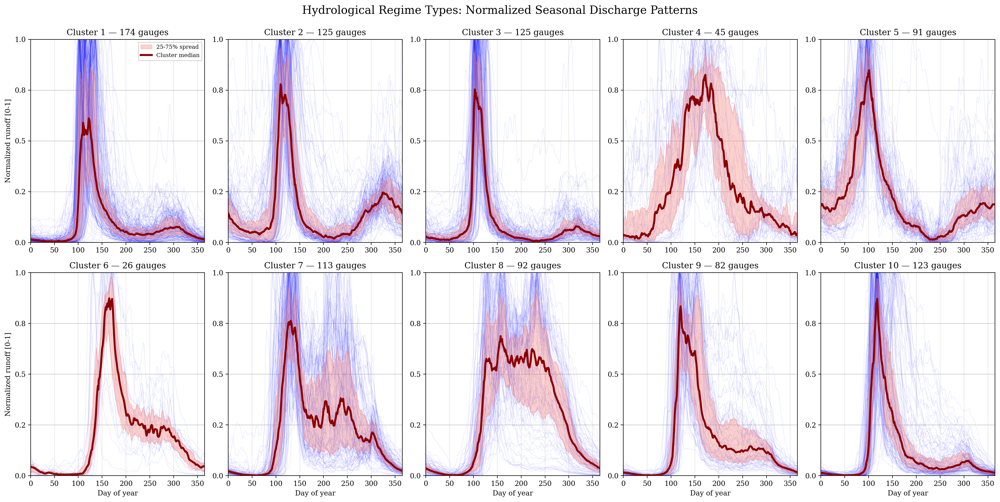

2025-11-26 15:59:30 | INFO     | PhDLogger | src.plots.cluster_plots | ℹ️  Saved spatial cluster map to ../res/chapter_one/map_hydro_clusters.png


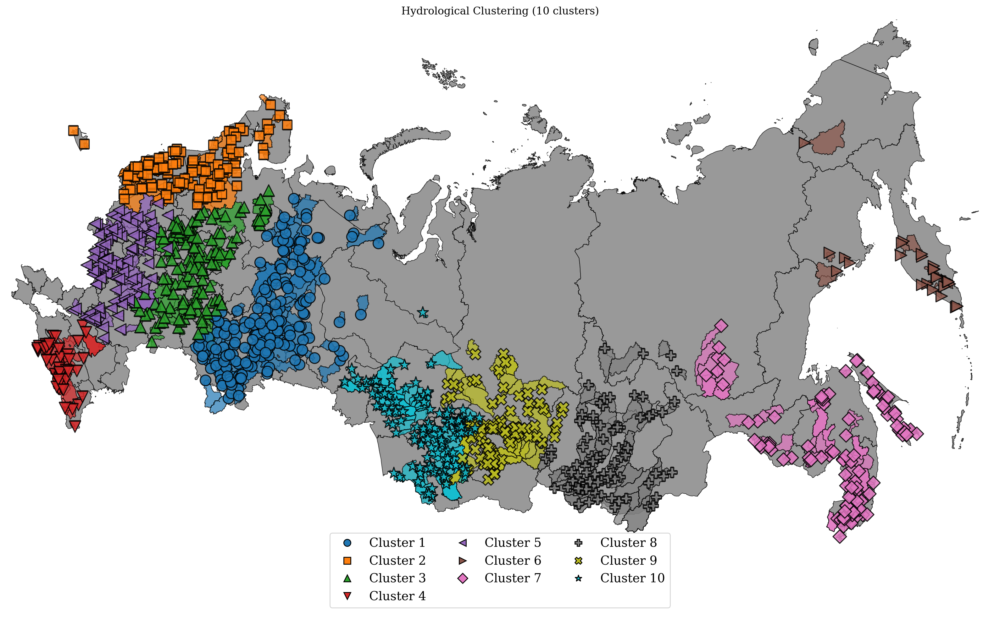

In [14]:
# Plot hydrographs
fig_hydro = plot_hydrograph_clusters(
    cluster_patterns,
    output_path="../res/chapter_one/hydrograph_clusters.png",
)
plt.show()

# Plot spatial distribution
fig_hydro_spatial = plot_spatial_clusters(
    watersheds=ws.loc[q_df_clust.index],
    gauges=gauges.loc[q_df_clust.index],
    cluster_labels=hydro_labels,
    cluster_col="hydro_cluster",
    basemap=basemap_data,
    output_path="../res/chapter_one/map_hydro_clusters.png",
    title="Hydrological Clustering (10 clusters)",
    show_watersheds=True,
    show_gauges=True,
)
plt.show()

## 4. Hybrid Classification


Raw hybrid combinations: 52
Combination counts:
hybrid_combo
Ф3-Г8     68
Ф1-Г5     68
Ф5-Г3     58
Ф9-Г7     57
Ф4-Г2     51
Ф1-Г3     51
Ф5-Г1     48
Ф1-Г1     47
Ф5-Г10    47
Ф5-Г2     43
Ф9-Г1     36
Ф5-Г7     28
Ф6-Г2     27
Ф2-Г4     27
Ф9-Г9     26
Ф8-Г1     24
Ф9-Г10    24
Ф3-Г6     22
Ф5-Г9     21
Ф8-Г10    20
Ф7-Г8     16
Ф1-Г4     15
Ф4-Г3     14
Ф5-Г5     14
Ф3-Г7     14
Ф1-Г10    13
Ф7-Г9     11
Ф4-Г1     11
Ф8-Г9     10
Ф6-Г7     10
Ф3-Г10    10
Ф3-Г9      9
Ф6-Г5      8
Ф6-Г8      6
Ф6-Г10     6
Ф6-Г1      4
Ф3-Г1      4
Ф1-Г2      3
Ф5-Г6      3
Ф1-Г9      3
Ф9-Г4      3
Ф7-Г10     2
Ф4-Г9      2
Ф7-Г7      2
Ф8-Г3      2
Ф9-Г8      2
Ф4-Г7      1
Ф9-Г2      1
Ф4-Г6      1
Ф2-Г10     1
Ф8-Г7      1
Ф8-Г5      1
Name: count, dtype: int64

Significant combinations (≥5 gauges): 15

Consolidated to 17 hybrid classes

Class distribution:
hybrid_class
Ф3-Г8       127
Ф1-Г5       102
Ф5-Г3        96
Ф9-Г7        87
Ф4-Г2        80
Ф6-Г2        61
Ф8-Mixed     58
Ф1-Г3        

2025-11-26 17:41:24 | INFO     | PhDLogger | src.plots.cluster_plots | ℹ️  Saved hybrid spatial cluster map to ../res/chapter_one/map_hybrid_classes_watersheds.png


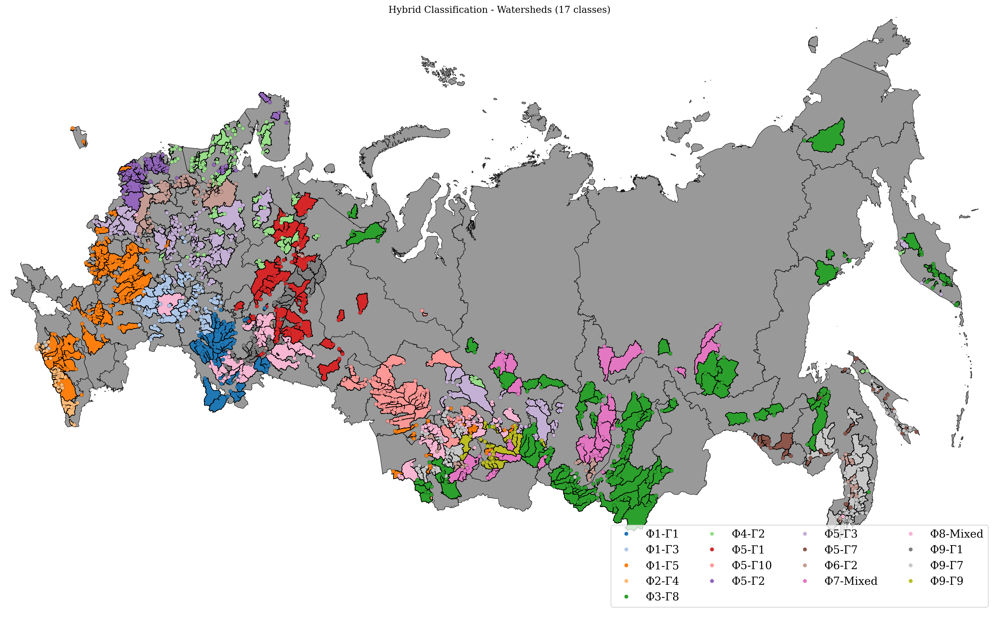

In [25]:
# Create hybrid labels (Ф#-Г# format)
# Ensure same index alignment
geo_labels_aligned = geo_labels[geo_scaled.index.isin(q_df_clust.index)]
hydro_labels_aligned = hydro_labels

# Create mapping for common gauges
common_gauges = q_df_clust.index.to_list()
geo_mapping = pd.Series(geo_labels, index=geo_scaled.index)
hydro_mapping = pd.Series(hydro_labels, index=q_df_clust.index)

# Build gauge mapping with hybrid labels
gauge_mapping = pd.DataFrame(
    {
        "gauge_id": common_gauges,
        "geo_cluster": geo_mapping.loc[common_gauges].values,
        "hydro_cluster": hydro_mapping.loc[common_gauges].values,
    }
)

# Create hybrid labels
gauge_mapping["hybrid_combo"] = gauge_mapping.apply(
    lambda row: f"Ф{row['geo_cluster']}-Г{row['hydro_cluster']}", axis=1
)

print(f"\nRaw hybrid combinations: {gauge_mapping['hybrid_combo'].nunique()}")

# Consolidate hybrid combinations using proper strategy
# Strategy: Keep top combinations, merge rare ones by geo cluster
combo_counts = gauge_mapping["hybrid_combo"].value_counts()
target_n_classes = 15
min_gauges = 5

print(f"Combination counts:\n{combo_counts}\n")

# Keep significant combinations
significant_combos = combo_counts[combo_counts >= min_gauges].head(target_n_classes)
print(f"Significant combinations (≥{min_gauges} gauges): {len(significant_combos)}")

# Create mapping
combo_mapping = {}

# Assign significant combos directly
for combo in significant_combos.index:
    combo_mapping[combo] = combo

# For rare combinations, merge by geo cluster
rare_combos = combo_counts[~combo_counts.index.isin(significant_combos.index)]

for combo in rare_combos.index:
    geo_cluster = combo.split("-")[0]  # Extract Ф1, Ф2, etc.

    # Find significant combos with same geo cluster
    geo_matches = [c for c in significant_combos.index if c.startswith(geo_cluster + "-")]

    if geo_matches:
        # Assign to most common geo-matched combo
        combo_mapping[combo] = geo_matches[0]
    else:
        # Group as "Ф#-Mixed"
        combo_mapping[combo] = f"{geo_cluster}-Mixed"

# Apply mapping
gauge_mapping["hybrid_class"] = gauge_mapping["hybrid_combo"].map(combo_mapping)

print(f"\nConsolidated to {gauge_mapping['hybrid_class'].nunique()} hybrid classes")
print("\nClass distribution:")
print(gauge_mapping["hybrid_class"].value_counts())

# Summary table of hybrid classes
class_summary = (
    gauge_mapping.groupby("hybrid_class")
    .agg(
        {
            "gauge_id": "count",
            "geo_cluster": lambda x: sorted(set(x)),
            "hydro_cluster": lambda x: sorted(set(x)),
        }
    )
    .rename(columns={"gauge_id": "n_gauges"})
)

class_summary = class_summary.sort_values("n_gauges", ascending=False)
class_summary["geo_clusters"] = class_summary["geo_cluster"].apply(
    lambda x: ", ".join([f"Ф{i}" for i in x])
)
class_summary["hydro_clusters"] = class_summary["hydro_cluster"].apply(
    lambda x: ", ".join([f"Г{i}" for i in x])
)

print("\nHybrid Class Summary:")
print("=" * 80)
print(class_summary[["n_gauges", "geo_clusters", "hydro_clusters"]].to_string())
print("=" * 80)
print(f"\nTotal classes: {len(class_summary)}")
print(f"Total gauges: {class_summary['n_gauges'].sum()}")
print(f"Mean gauges per class: {class_summary['n_gauges'].mean():.1f}")
print(f"Median gauges per class: {class_summary['n_gauges'].median():.1f}")

# Plot hybrid spatial distribution with watersheds
fig_hybrid_ws = plot_hybrid_spatial_clusters(
    watersheds=ws,
    gauges=gauges,
    gauge_mapping=gauge_mapping,
    hybrid_col="hybrid_class",
    basemap=basemap_data,
    output_path="../res/chapter_one/map_hybrid_classes_watersheds.png",
    title=f"Hybrid Classification - Watersheds ({len(class_summary)} classes)",
    show_watersheds=True,
    show_gauges=True,
)
plt.show()

2025-11-26 15:59:49 | INFO     | PhDLogger | src.plots.cluster_plots | ℹ️  Saved hybrid spatial cluster map to ../res/chapter_one/map_hybrid_classes_gauges.png


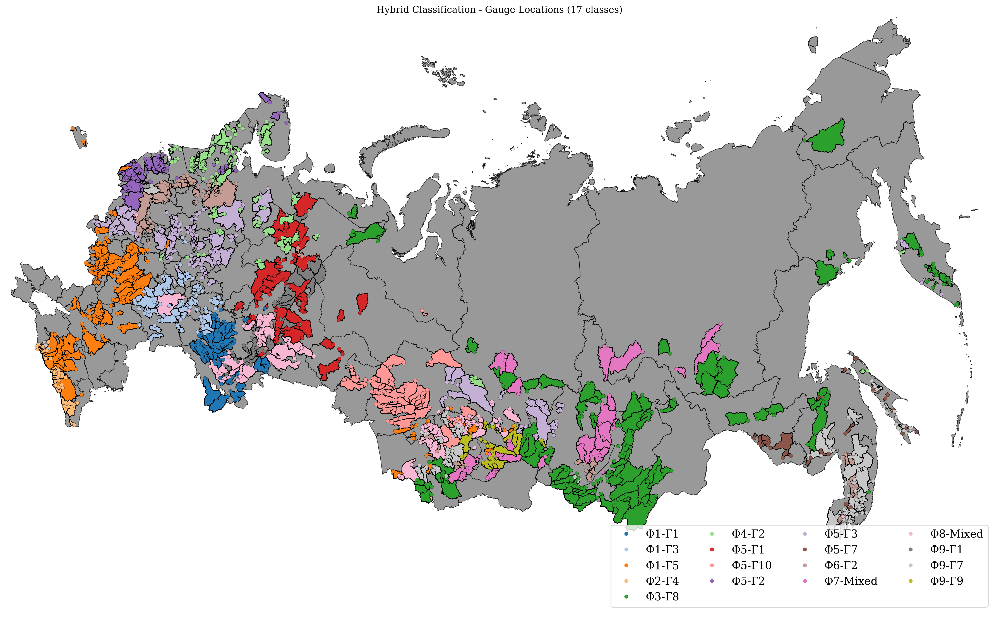

In [19]:
# Plot hybrid spatial distribution with gauges only (more readable)
fig_hybrid_gauges = plot_hybrid_spatial_clusters(
    watersheds=ws,
    gauges=gauges,
    gauge_mapping=gauge_mapping,
    hybrid_col="hybrid_class",
    basemap=basemap_data,
    output_path="../res/chapter_one/map_hybrid_classes_gauges.png",
    title=f"Hybrid Classification - Gauge Locations ({len(class_summary)} classes)",
    show_watersheds=True,
    show_gauges=True,
)
plt.show()

In [20]:
# Summary table of hybrid classes
class_summary = (
    gauge_mapping.groupby("hybrid_class")
    .agg(
        {
            "gauge_id": "count",
            "geo_cluster": lambda x: list(x.unique()),
            "hydro_cluster": lambda x: list(x.unique()),
        }
    )
    .rename(columns={"gauge_id": "n_gauges"})
)

class_summary = class_summary.sort_values("n_gauges", ascending=False)
class_summary["geo_clusters"] = class_summary["geo_cluster"].apply(
    lambda x: ", ".join([f"Ф{i}" for i in sorted(x)])
)
class_summary["hydro_clusters"] = class_summary["hydro_cluster"].apply(
    lambda x: ", ".join([f"Г{i}" for i in sorted(x)])
)

print("\nHybrid Class Summary:")
print("=" * 80)
print(class_summary[["n_gauges", "geo_clusters", "hydro_clusters"]].to_string())
print("=" * 80)
print(f"\nTotal classes: {len(class_summary)}")
print(f"Total gauges: {class_summary['n_gauges'].sum()}")
print(f"Mean gauges per class: {class_summary['n_gauges'].mean():.1f}")
print(f"Median gauges per class: {class_summary['n_gauges'].median():.1f}")


Hybrid Class Summary:
              n_gauges geo_clusters           hydro_clusters
hybrid_class                                                
Ф3-Г8              127           Ф3  Г1, Г6, Г7, Г8, Г9, Г10
Ф1-Г5              102           Ф1      Г2, Г4, Г5, Г9, Г10
Ф5-Г3               96           Ф5           Г3, Г5, Г6, Г9
Ф9-Г7               87           Ф9      Г2, Г4, Г7, Г8, Г10
Ф4-Г2               80           Ф4   Г1, Г2, Г3, Г6, Г7, Г9
Ф6-Г2               61           Ф6  Г1, Г2, Г5, Г7, Г8, Г10
Ф8-Mixed            58           Ф8  Г1, Г3, Г5, Г7, Г9, Г10
Ф1-Г3               51           Ф1                       Г3
Ф5-Г1               48           Ф5                       Г1
Ф1-Г1               47           Ф1                       Г1
Ф5-Г10              47           Ф5                      Г10
Ф5-Г2               43           Ф5                       Г2
Ф9-Г1               36           Ф9                       Г1
Ф7-Mixed            31           Ф7          Г7, Г8, Г9, Г10
Ф

In [21]:
# Export gauge mapping
gauge_mapping_export = gauge_mapping.copy()
gauge_mapping_export["geo_cluster_ru"] = gauge_mapping_export["geo_cluster"].apply(
    lambda x: f"Ф{x}"
)
gauge_mapping_export["hydro_cluster_ru"] = gauge_mapping_export["hydro_cluster"].apply(
    lambda x: f"Г{x}"
)

export_gauge_mapping_csv(
    gauge_mapping_export,
    output_path="../res/chapter_one/gauge_hybrid_mapping.csv",
    columns=[
        "gauge_id",
        "geo_cluster_ru",
        "hydro_cluster_ru",
        "hybrid_combo",
        "hybrid_class",
    ],
)

print("✓ Exported gauge mapping to CSV")

✓ Exported gauge mapping to CSV


In [22]:
# Generate README
generate_cluster_readme(
    output_dir="../docs/cluster_references",
    n_geo_clusters=n_geo_clusters,
    n_hydro_clusters=n_hydro_clusters,
    n_hybrid_classes=gauge_mapping["hybrid_class"].nunique(),
)

print("✓ Generated cluster documentation")

✓ Generated cluster documentation
